<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Satellite Image Data <br><br><br>Analysis using numpy</p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>Data Source: Satellite Image from WIFIRE Project</p>


WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">Loading the libraries we need: numpy, scipy, matplotlib</p>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import misc

import warnings
warnings.filterwarnings('ignore') #可以把warning關掉

%matplotlib inline

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Creating a numpy array from an image file:</p> 

<br>
Lets choose a WIFIRE satellite image file as an ndarray and display its type.

In [2]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg') # Read an image from a file as an array.

type(photo_data)

numpy.ndarray

Let's see what is in this image. 

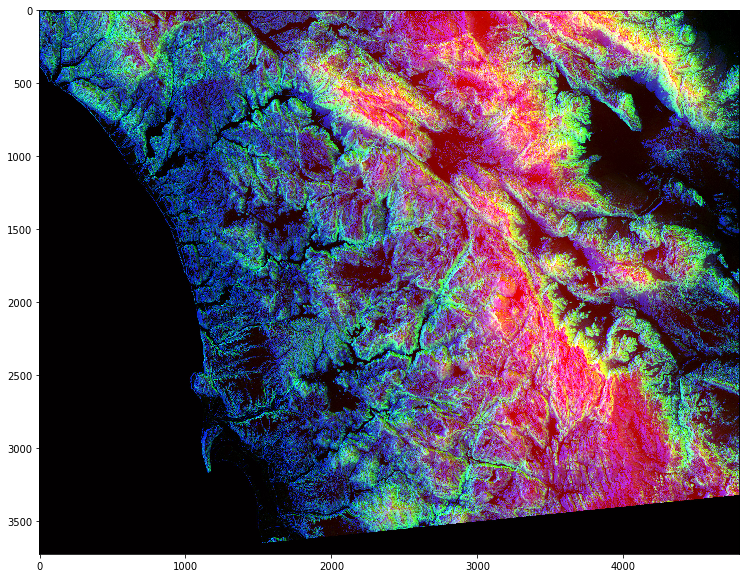

In [3]:
plt.figure(figsize=(14,10)) #調整圖片尺寸
plt.imshow(photo_data) #顯示圖片

In [4]:
photo_data.shape #可顯示維度

(3725, 4797, 3)

3725 is the height, and width is 4797, and it has 3 layers for RGB

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.


In [5]:
#print(photo_data)

In [6]:
# check it's size
photo_data.size

53606475

In [7]:
# check the maximum and minimum of the data values 
photo_data.min(), photo_data.max()

(0, 255)

確定RGB數值在0~255之間

In [8]:
# Check the average pixel value
photo_data.mean()

75.8299354508947

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Check Pixel on the 150th Row and 250th Column</p>

In [9]:
photo_data[150,250] #檢查這位置的RGB values, 得到結果為R= 17, G = 35, B= 255

array([ 17,  35, 255], dtype=uint8)

In [10]:
photo_data[150,250,1] #1是顯示第二個數值, 在這邊為G. 可以自由選擇 0= R, G= 1, B= 2

35

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

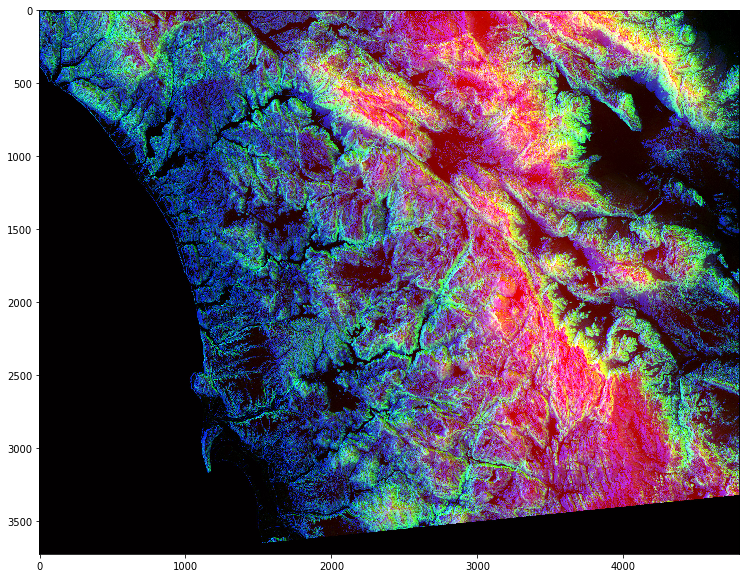

In [11]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[150,250] = 0 #set that pixel to zero
plt.figure(figsize=(14,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Changing colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.

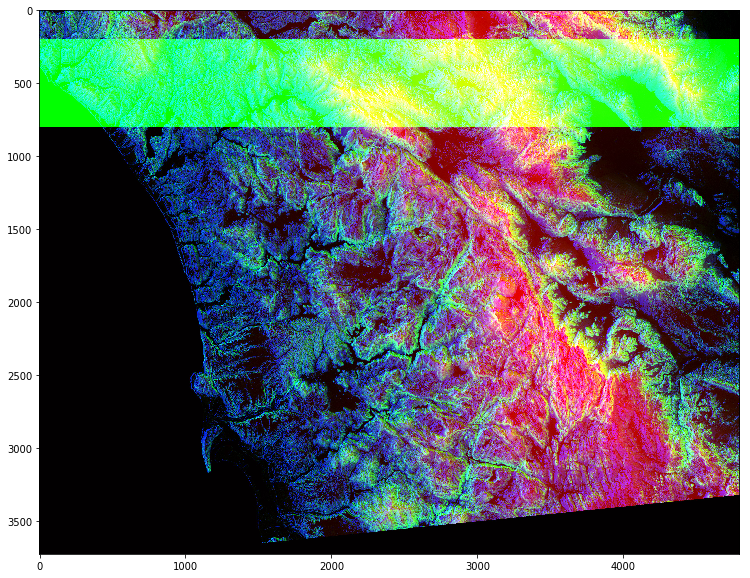

In [12]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, : , 1] = 255
#We set every value from row 200 to 800 [200:800] for all the columns[ : ] to 255(綠色開滿). And only the green layer [1]

plt.figure(figsize = (14,10))
plt.imshow(photo_data)

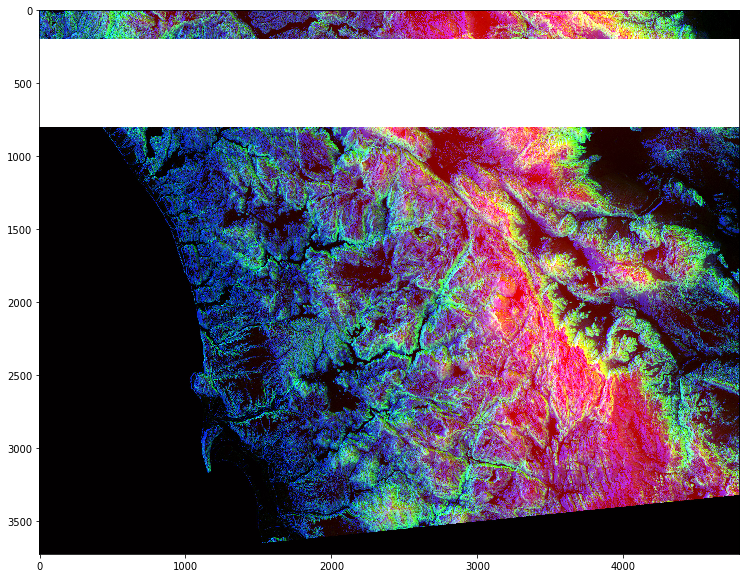

In [13]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, :] = 255 
#All the columns in the range 200 to 800 for the rows to be full intensity (show up as white bcs three colors are 255)

plt.figure(figsize=(14,10))
plt.imshow(photo_data)

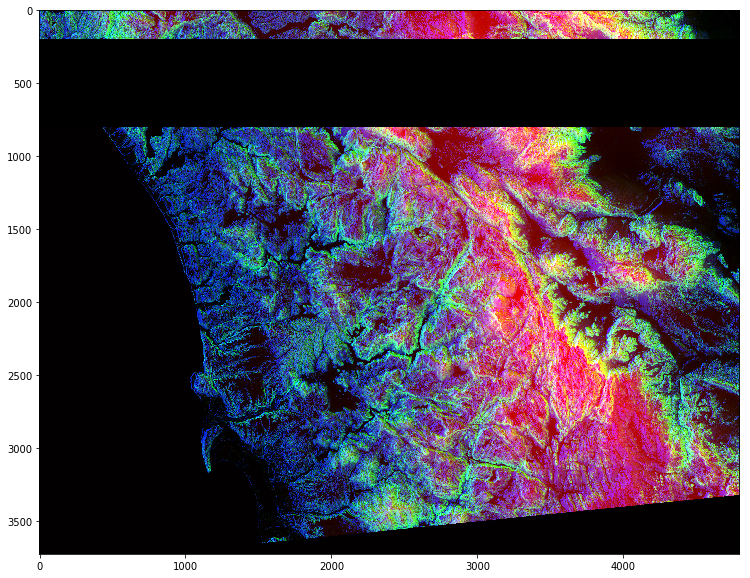

In [14]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, :] = 0
#All the columns in the range 200 to 800 for the rows to be full intensity (show up as black bcs three colors are 0)

plt.figure(figsize=(14,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all Pixels with Low Values</p>

In [15]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
print('Shape of photo data: ', photo_data.shape)
low_value_filter = photo_data < 200 
# We use comparison to select all values that are less than 200. This will create the bullien 
# ndarray of the same shape with our original array. With low intensity we can call them points of less interest

print('Shape of low_value_filter: ', low_value_filter.shape)

Shape of photo data:  (3725, 4797, 3)
Shape of low_value_filter:  (3725, 4797, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtering Out Low Values</p><br/>
Whenever the low_value_filter is True, set value to 0.

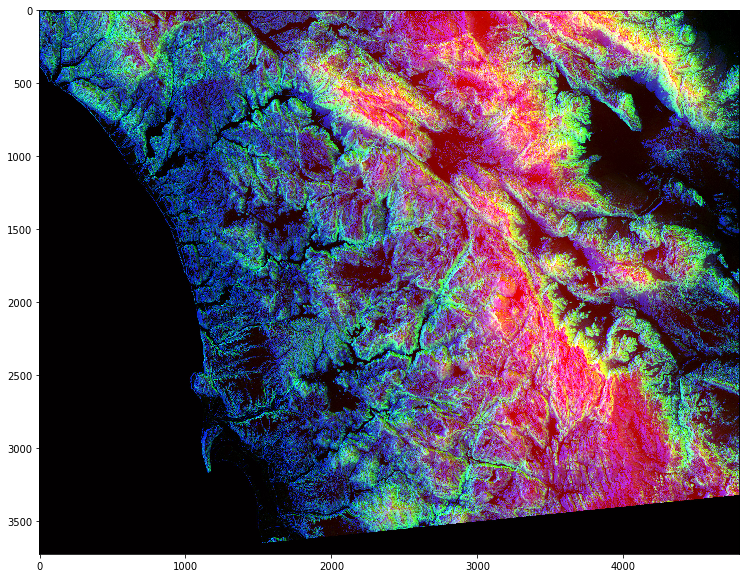

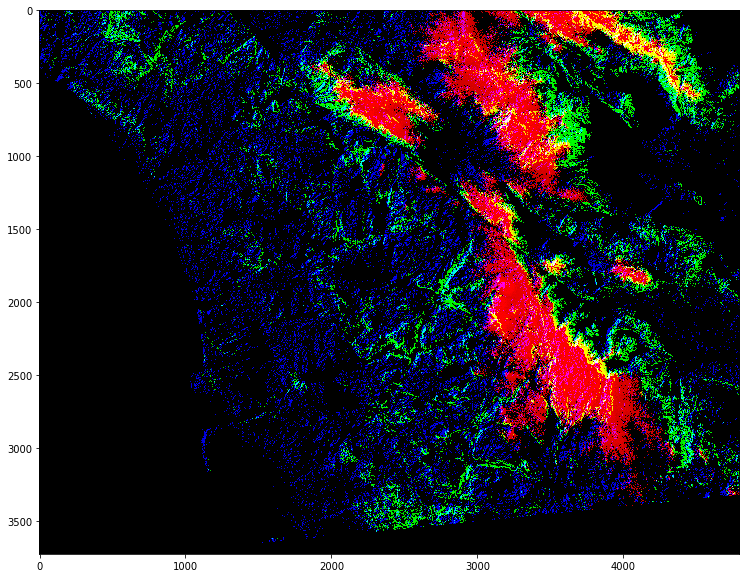

In [16]:
plt.figure(figsize=(14,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0 # 把low_value_filter < 200 的都變成0(黑色)
plt.figure(figsize=(14,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
More Row and Column Operations</p><br>
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [17]:
rows_range = np.arange(len(photo_data)) # We create arange array called rows_range
cols_range = rows_range # We assign that same array to array called cols_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [18]:
photo_data[rows_range, cols_range] = 255 #變成白色

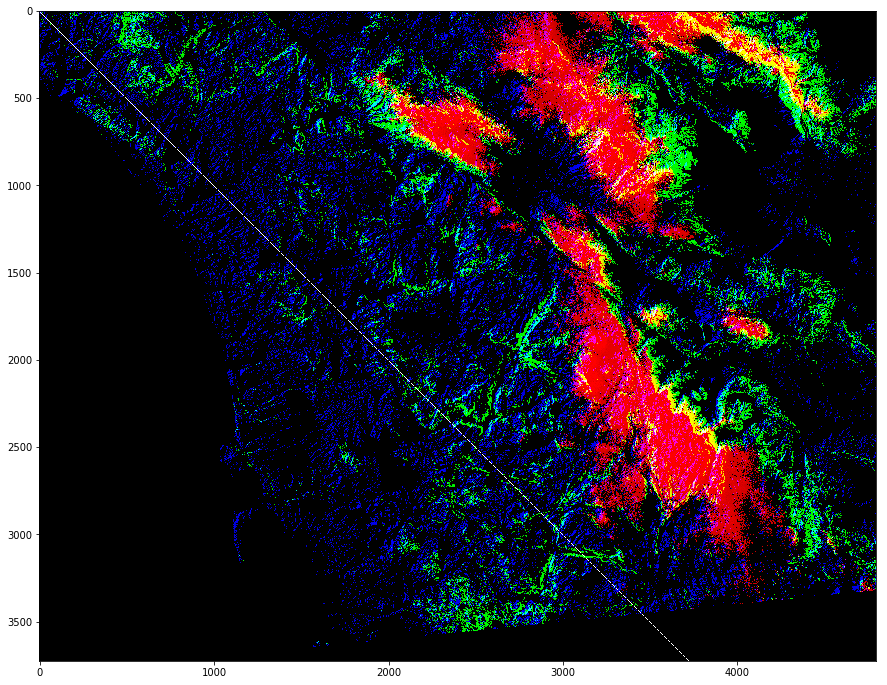

In [19]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now let us try something even cooler...a mask that is in shape of a circular disc.

<img src="./1494532821.png" align="left" style="width:550px;height:360px;"/>

In [20]:
total_rows, total_cols, total_layers = photo_data.shape
print('photo_data = ', photo_data.shape)

X, Y = np.ogrid[ :total_rows, :total_cols] 
print('X = ', X.shape, ' and Y = ', Y.shape)

photo_data =  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


1、arange函数产生的是一维数组，而ogrid函数产生的是二维数组<br>

2、arange函数产生的是一个数组，而mgrid函数产生的是二个数组<br>

3、ogrid函数产生的数组，第一个数组是以纵向产生的，即数组第二维的大小始终为1。第二个数组是以横向产生的，即数组第一维的大小始终为1。<br>

## np.ogrid & no.mgrid examples

In [21]:
x, y = np.ogrid[:4, :5]

In [22]:
x

array([[0],
       [1],
       [2],
       [3]])

In [23]:
y

array([[0, 1, 2, 3, 4]])

In [24]:
x, y = np.mgrid[:4, :5]

In [25]:
x

array([[0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1],
       [2, 2, 2, 2, 2],
       [3, 3, 3, 3, 3]])

In [26]:
y

array([[0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4]])

In [27]:
# Next we will now calculate the center point x, and y
center_row, center_col = total_rows / 2, total_cols / 2
print('center_row = ', center_row, ' And center_col = ', center_col)
print()
print(X - center_row)
print()
print(Y - center_col)
print()
dist_from_center = (X - center_row)**2 + (Y- center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print()
print('Radius = ', radius)
circular_mask = (dist_from_center > radius) 
# To set all the circuler values outside of the circle to be true in circular mask
print()
print('circular mask = ', circular_mask) #外圍的數值, 預期應為True
print()
print(circular_mask[1500:1700, 2000:2200]) #如果選擇靠近中心點的數值, 預期應該都False

center_row =  1862.5  And center_col =  2398.5

[[-1862.5]
 [-1861.5]
 [-1860.5]
 ...
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]

[[-2398.5 -2397.5 -2396.5 ...  2395.5  2396.5  2397.5]]

[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]

Radius =  3468906.25

circular mask =  [[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ...

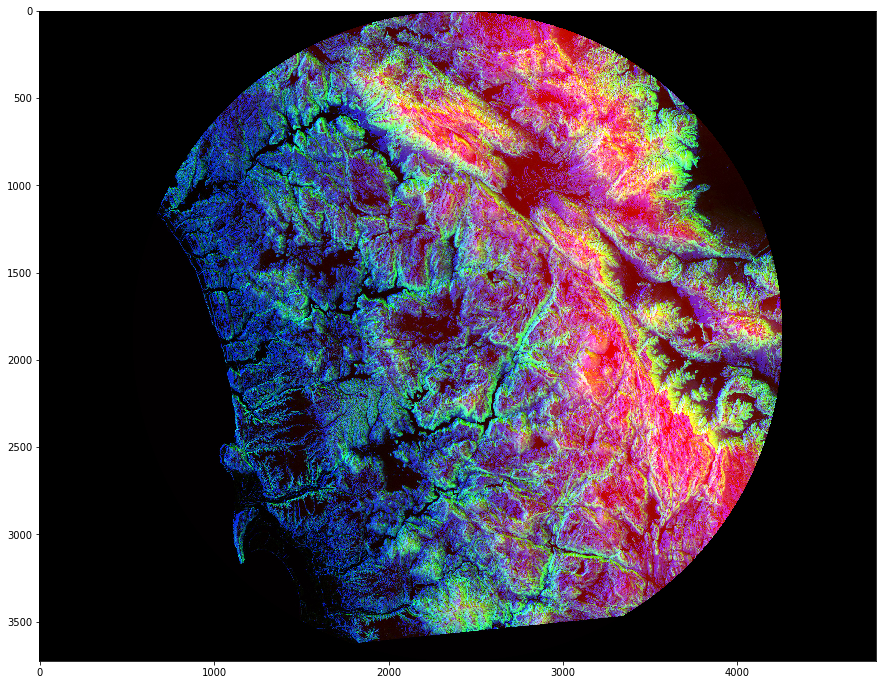

In [28]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0 #變成黑色
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Further Masking</p>
<br/>You can further improve the mask, for example just get upper half disc.

In [29]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row 
#產生center_row以上的數值(row)
# this line generates a mask for all rows above the center

half_upper_circular_mask = np.logical_and(half_upper, circular_mask)

### np.logical_and(x1, x2) (邏輯與) <br>
x1, x2之中只要一個False, 及判斷False. <br><br>
### np.logical_or(x1,x2)(邏輯或) <br>
x1, x2之中只要一個True, 及判斷True.

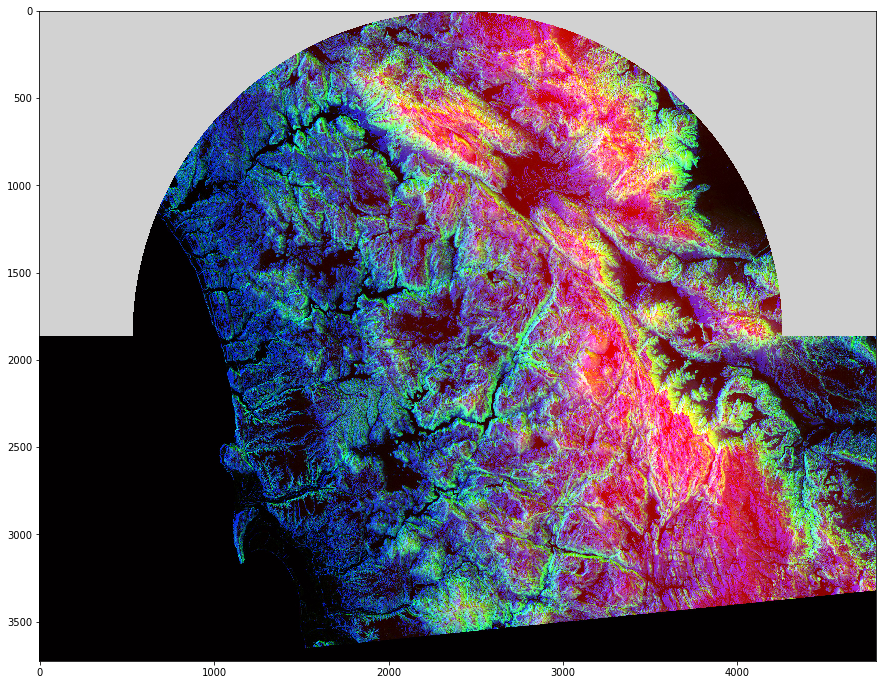

In [30]:
import random
photo_data = misc.imread('./wifire/sd-3layers.jpg')
#photo_data[half_upper_circular_mask] = 255 #True即轉白
photo_data[half_upper_circular_mask] = random.randint(200,255) #或者可以用隨機分佈200-255之間, 不是pure white
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Further Processing of our Satellite Imagery </p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

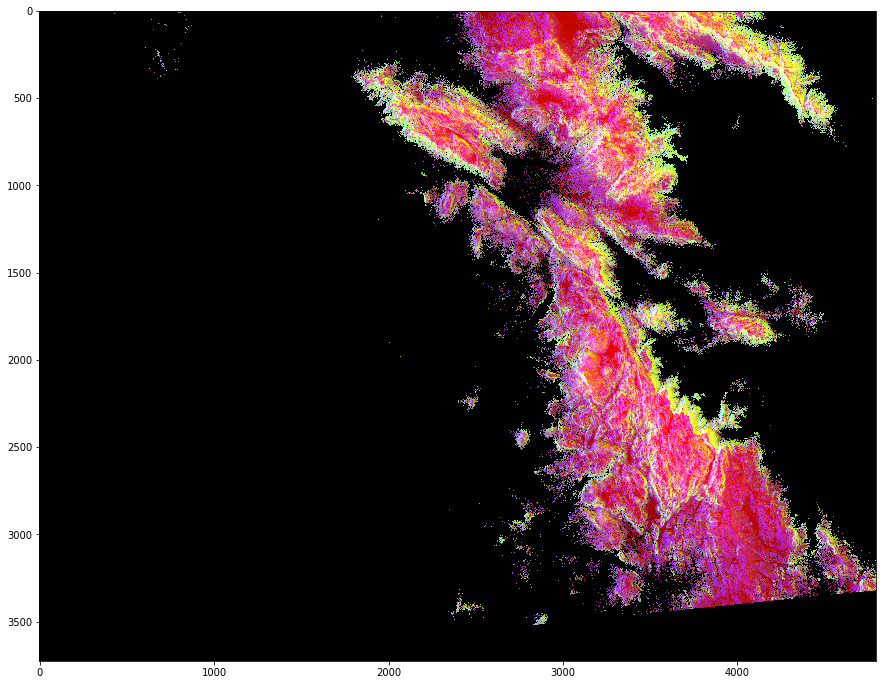

In [31]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask = photo_data[ : , : , 0] < 150 # 記得最後放0, 因為調整紅色
# All the red values that are less than 150, the row and column index for those will be true in our red mask
photo_data[red_mask] = 0 #把Red 數值<150都變黑, 這樣顯示出來的是高緯度的圖
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

We only diplay the high elevation areas that had red indensity of 150 or higher

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-GREEN Pixels</p>

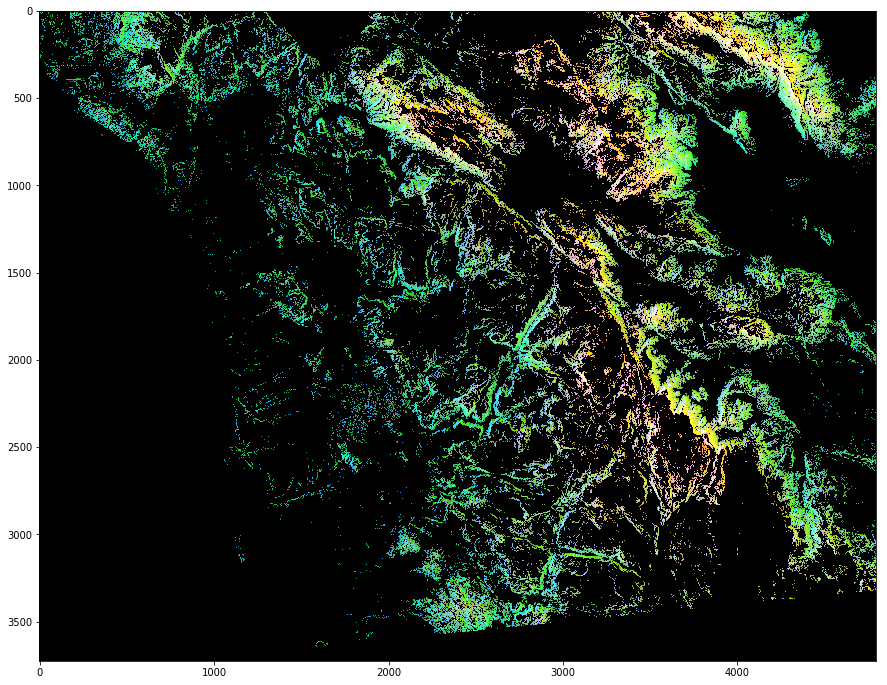

In [32]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[ : , : , 1] < 150 #只要Green數值150以下的都為True

photo_data[green_mask] = 0 #把True的數值變成黑色
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

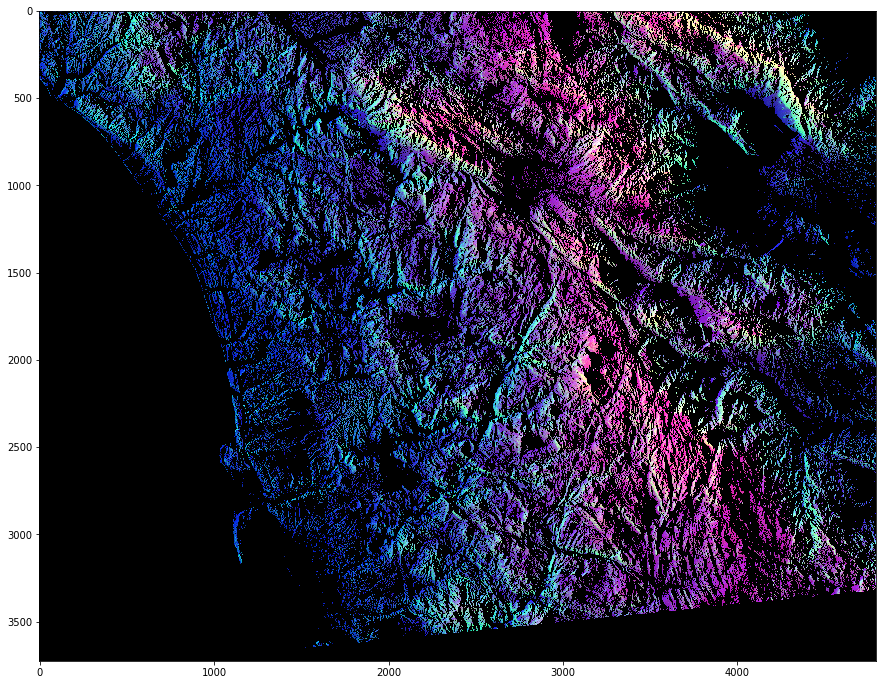

In [33]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask = photo_data[ : , : , 2] < 150 #只要Blue數值150以下的都為True

photo_data[blue_mask] = 0 #把True的數值變成黑色
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

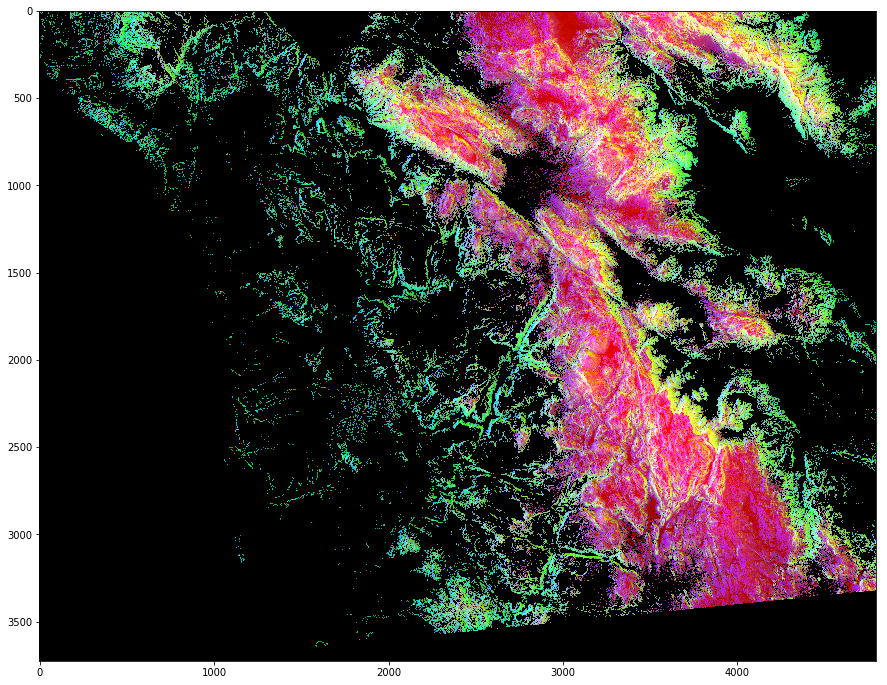

In [34]:
# Create a composite mask for point with high elevation, high aspect, and low slope using the np.logical_and
photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask = photo_data[ : , : , 0] < 150 # filter out low elevation
green_mask = photo_data[ : , : , 1] < 150 #filter out low aspect
blue_mask = photo_data[ : , : , 2] > 150 #filter out high slope

final_mask = np.logical_and(red_mask, green_mask, blue_mask)

photo_data[final_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data)